# **CycleGAN**

## Imports

In [ ]:
import numpy as np
import pandas as pd
import torch
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from tqdm import tqdm
import matplotlib.pyplot as plt
from PIL import Image, ImageShow
import os
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.utils import save_image

## Implementation

### Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, input_nc):
        super(Discriminator, self).__init__()

        # A bunch of convolutions one after another
        model = [   nn.Conv2d(input_nc, 64, 4, stride=2, padding=1),
                    nn.LeakyReLU(0.2, inplace=True) ]

        model += [  nn.Conv2d(64, 128, 4, stride=2, padding=1),
                    nn.InstanceNorm2d(128),
                    nn.LeakyReLU(0.2, inplace=True) ]

        model += [  nn.Conv2d(128, 256, 4, stride=2, padding=1),
                    nn.InstanceNorm2d(256),
                    nn.LeakyReLU(0.2, inplace=True) ]

        model += [  nn.Conv2d(256, 512, 4, padding=1),
                    nn.InstanceNorm2d(512),
                    nn.LeakyReLU(0.2, inplace=True) ]

        # FCN classification layer
        model += [nn.Conv2d(512, 1, 4, padding=1)]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        x =  self.model(x)
        return (x.view(x.size(0), -1))

## U-net

In [ ]:
class ConvBlock(torch.nn.Module):
    def __init__(self, input_channel, output_channel,batch_normalization=True):
        super(ConvBlock, self).__init__()

        self.conv1 = torch.nn.Conv2d(input_channel, output_channel, 3, padding=1)
        self.bn1 = torch.nn.BatchNorm2d(output_channel)
        self.conv2 = torch.nn.Conv2d(output_channel,output_channel,3,padding=1)
        self.bn2 = torch.nn.BatchNorm2d(output_channel)
        self.relu = torch.nn.ReLU()
        self.batch_normalization = batch_normalization

    def forward(self,x):
        x = self.conv1(x)
        if self.batch_normalization:
            x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        if self.batch_normalization:
            x = self.bn2(x)

        x=self.relu(x)

        return x


class DownSample(torch.nn.Module):
    def __init__(self, factor=2):
        super(DownSample, self).__init__()
        self.down_sample = torch.nn.MaxPool2d(factor, factor)

    def forward(self,x):
        return self.down_sample(x)


class UpSample(torch.nn.Module):
    def __init__(self, factor=2):
        super(UpSample, self).__init__()
        self.up_sample = torch.nn.Upsample(scale_factor = factor, mode='bilinear')

    def forward(self,x):
        return self.up_sample(x)


class CropConcat(torch.nn.Module):
    def __init__(self,crop = True):
        super(CropConcat, self).__init__()
        self.crop = crop

    def do_crop(self,x, tw, th):
        b,c,w, h = x.size()
        x1 = int(round((w - tw) / 2.))
        y1 = int(round((h - th) / 2.))
        return x[:,:,x1:x1 + tw, y1:y1 + th]

    def forward(self,x,y):
        b, c, h, w = y.size()
        if self.crop:
            x = self.do_crop(x,h,w)
        return torch.cat((x,y),dim=1)


class UpBlock(torch.nn.Module):
    def __init__(self,input_channel, output_channel,batch_normalization=True,downsample = False):
        super(UpBlock, self).__init__()
        self.downsample = downsample
        self.conv = ConvBlock(input_channel,output_channel,batch_normalization=batch_normalization)
        self.downsampling = DownSample()

    def forward(self,x):
        x1 = self.conv(x)
        if self.downsample:
            x = self.downsampling(x1)
        else:
            x = x1
        return x,x1

class DownBlock(torch.nn.Module):
    def __init__(self,input_channel, output_channel,batch_normalization=True,Upsample = False):
        super(DownBlock, self).__init__()
        self.Upsample = Upsample
        self.conv = ConvBlock(input_channel,output_channel,batch_normalization=batch_normalization)
        self.upsampling = UpSample()
        self.crop = CropConcat()

    def forward(self,x,y):
        if self.Upsample:
            x = self.upsampling(x)
        x = self.crop(y,x)
        x = self.conv(x)
        return x


class Unet(torch.nn.Module):
    def __init__(self,input_channel,output_channel):
        super(Unet, self).__init__()
        #Down Blocks
        self.conv_block1 = ConvBlock(input_channel,64)
        self.conv_block2 = ConvBlock(64,128)
        self.conv_block3 = ConvBlock(128,256)
        self.conv_block4 = ConvBlock(256,512)
        self.conv_block5 = ConvBlock(512,1024)

        #Up Blocks
        self.conv_block6 = ConvBlock(1024+512, 512)
        self.conv_block7 = ConvBlock(512+256, 256)
        self.conv_block8 = ConvBlock(256+128, 128)
        self.conv_block9 = ConvBlock(128+64, 64)

        #Last convolution
        self.last_conv = torch.nn.Conv2d(64,output_channel,1)

        self.crop = CropConcat()

        self.downsample = DownSample()
        self.upsample =   UpSample()

    def forward(self,x):

        x1 = self.conv_block1(x)
        x = self.downsample(x1)
        x2 = self.conv_block2(x)
        x= self.downsample(x2)
        x3 = self.conv_block3(x)
        x= self.downsample(x3)
        x4 = self.conv_block4(x)
        x = self.downsample(x4)
        x5 = self.conv_block5(x)

        x = self.upsample(x5)
        x = self.crop(x4, x)
        x = self.conv_block6(x)

        x = self.upsample(x)
        x = self.crop(x3,x)
        x = self.conv_block7(x)

        x= self.upsample(x)
        x= self.crop(x2,x)
        x = self.conv_block8(x)

        x = self.upsample(x)
        x = self.crop(x1,x)
        x = self.conv_block9(x)


        x = self.last_conv(x)

        return x

### Generator

In [ ]:
class Generator(nn.Module):
  def __init__(self, residual_blocks_num=9):
    super(Generator, self).__init__()

    # Encoder
    encoder_filters_number = [3, 64, 128, 256]
    encoder_filters_size = [7, 3, 3]
    encoder_strides = [1, 2, 2]
    encoder_paddings = [3, 1, 1]
    self.encoder_layers = nn.ModuleList()
    encoder_layers_num = 3

    for i in range(encoder_layers_num):
      self.encoder_layers.append(nn.Conv2d(encoder_filters_number[i], encoder_filters_number[i+1],
                                           kernel_size=encoder_filters_size[i], stride=encoder_strides[i], padding=encoder_paddings[i], padding_mode="reflect"))
      self.encoder_layers.append(nn.InstanceNorm2d(encoder_filters_number[i+1]))
      self.encoder_layers.append(nn.ReLU(inplace=True))

    # Decoder
    decoder_filters_number = [256, 128, 64, 3]
    decoder_filters_size = [3, 3, 7]
    decoder_strides = [2, 2, 1]
    decoder_paddings = [1, 1, 3]
    self.decoder_layers = nn.ModuleList()
    decoder_layers_num = 3

    for i in range(decoder_layers_num-1):
      self.decoder_layers.append(nn.ConvTranspose2d(decoder_filters_number[i], decoder_filters_number[i+1],
                                           kernel_size=decoder_filters_size[i], stride=decoder_strides[i],
                                           padding=decoder_paddings[i], output_padding=1))
      self.decoder_layers.append(nn.InstanceNorm2d(decoder_filters_number[i+1]))
      self.decoder_layers.append(nn.ReLU(inplace=True))
    self.decoder_layers.append(nn.Conv2d(decoder_filters_number[decoder_layers_num-1], decoder_filters_number[decoder_layers_num],
                                           kernel_size=decoder_filters_size[decoder_layers_num-1], stride=decoder_strides[decoder_layers_num-1],
                                           padding=decoder_paddings[decoder_layers_num-1], padding_mode="reflect"))
    
    # Residual
    self.residual_layers = nn.ModuleList()
    for i in range(residual_blocks_num):
      residual_block = nn.ModuleList()
      residual_block.append(nn.Conv2d(256, 256, kernel_size=3, padding=1, padding_mode="reflect"))
      residual_block.append(nn.InstanceNorm2d(256))
      residual_block.append(nn.ReLU(inplace=True))
      residual_block.append(nn.Conv2d(256, 256, kernel_size=3, padding=1, padding_mode="reflect"))
      residual_block.append(nn.InstanceNorm2d(256))
      residual_block.append(nn.Identity())
      self.residual_layers.append(residual_block)

  def encode(self, input):
    out = input 
    for layer in self.encoder_layers:
      out = layer(out)
    return out
  
  def residual(self, input):
    out = input 
    block_inp = input
    for residual_block in self.residual_layers:
      for layer in residual_block:
        out = layer(out)
      out = out + block_inp
      block_inp = out
    return out

  def decode(self, input):
    out = input 
    for layer in self.decoder_layers:
      out = layer(out)
    return out
    
  def forward(self, input):
    out = self.encode(input)
    out = self.residual(out)
    out = self.decode(out)
    return torch.tanh(out)

## Download Data

In [ ]:
!git clone https://github.com/giddyyupp/ganilla.git

Cloning into 'ganilla'...
remote: Enumerating objects: 294, done.
remote: Total 294 (delta 0), reused 0 (delta 0), pack-reused 294
Receiving objects: 100% (294/294), 10.83 MiB | 6.54 MiB/s, done.
Resolving deltas: 100% (135/135), done.


In [ ]:
cd ganilla

/content/ganilla


In [ ]:
!bash ./datasets/download_cyclegan_dataset.sh summer2winter_yosemite

Specified [summer2winter_yosemite]
for details.

--2022-07-09 10:48:19--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/summer2winter_yosemite.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.244.190
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 132640856 (126M) [application/zip]
Saving to: ‘./datasets/summer2winter_yosemite.zip’

./datasets/summer2w 100%[===================>] 126.50M  16.6MB/s    in 8.8s    

2022-07-09 10:48:29 (14.3 MB/s) - ‘./datasets/summer2winter_yosemite.zip’ saved [132640856/132640856]

Archive:  ./datasets/summer2winter_yosemite.zip
   creating: ./datasets/summer2winter_yosemite/trainA/
  inflating: ./datasets/summer2winter_yosemite/trainA/2014-07-01 10:31:48.jpg  
  inflating: ./datasets/summer2winter_yosemite/trainA/2015-07-01 23:43:46.jpg  
  inflating: ./datasets/summer2winter_yosemite/trainA/2014-07-27 

In [ ]:
os.rename('/content/ganilla/datasets/summer2winter_yosemite/testA','/content/ganilla/datasets/summer2winter_yosemite/test_summer')
os.rename('/content/ganilla/datasets/summer2winter_yosemite/testB','/content/ganilla/datasets/summer2winter_yosemite/test_winter')
os.rename('/content/ganilla/datasets/summer2winter_yosemite/trainA','/content/ganilla/datasets/summer2winter_yosemite/train_summer')
os.rename('/content/ganilla/datasets/summer2winter_yosemite/trainB','/content/ganilla/datasets/summer2winter_yosemite/train_winter')

In [ ]:
!pip install albumentations==0.4.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 117 kB 30.6 MB/s 
     |████████████████████████████████| 948 kB 54.2 MB/s 
  Created wheel for albumentations: filename=albumentations-0.4.6-py3-none-any.whl size=65174 sha256=3dc7f2f77ef5435ffa1e04be4a9f1a3fec18c53a83640caef48c250dee077e21
  Stored in directory: /root/.cache/pip/wheels/cf/34/0f/cb2a5f93561a181a4bcc84847ad6aaceea8b5a3127469616cc
Successfully built albumentations
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

class Summer2WinterDataset(Dataset):
  def __init__(self, summers_path, winters_path):
    self.summers_path = summers_path
    self.winters_path = winters_path

    self.summers = os.listdir(summers_path)
    self.winters = os.listdir(winters_path)
    
    self.summers_len = len(self.summers)
    self.winters_len = len(self.winters)

    self.transforms = A.Compose(
    [
      A.Resize(width=256, height=256),
      A.HorizontalFlip(p=0.5),
      A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255),
      ToTensorV2(),
    ],
  additional_targets={"image0": "image"},)

  def __len__(self):
    return min(max(self.summers_len, self.winters_len), 4000)

  def __getitem__(self, index):
    summer_path = os.path.join(self.summers_path, self.summers[index % self.summers_len])
    winter_path = os.path.join(self.winters_path, self.winters[index % self.winters_len])

    summer = np.array(Image.open(summer_path).convert("RGB"))
    winter = np.array(Image.open(winter_path).convert("RGB"))

    augmentations = self.transforms(image=summer, image0=winter)
    summer = augmentations["image"]
    winter = augmentations["image0"]
    return summer, winter

## Train and Test

In [ ]:
def train(train_loader, G_summer2winter, D_summer2winter, G_winter2summer, D_winter2summer, D_opt, G_opt, epochs_num):
  MSE = nn.MSELoss()
  L1 = nn.L1Loss()
  G_scaler = torch.cuda.amp.GradScaler()
  D_scaler = torch.cuda.amp.GradScaler()
  summers = [[] for i in range(epochs_num)]
  winters = [[] for i in range(epochs_num)]
  all_train_loss = {'G':[], 'D':[]}

  for i, epoch in tqdm(enumerate(range(1, epochs_num+1))):
    epoch_D_loss = 0
    epoch_G_loss = 0
    record_num = 0
    for index, data in enumerate(train_loader):
      summer, winter = data
      summer, winter = summer.cuda(), winter.cuda()

      # Train Discriminator
      with torch.cuda.amp.autocast():
        # Winter to Summer
        generated_summer = G_winter2summer(winter)
        real_summer_D =  D_winter2summer(summer)
        generated_summer_D =  D_winter2summer(generated_summer.detach())
        real_summer_D_loss = MSE(real_summer_D, torch.ones_like(real_summer_D))
        generated_summer_D_loss = MSE(generated_summer_D, torch.zeros_like(generated_summer_D))
        summer_loss_D = real_summer_D_loss + generated_summer_D_loss
        
        # Summer to Winter
        generated_winter = G_summer2winter(summer)
        real_winter_D =  D_summer2winter(winter)
        generated_winter_D =  D_summer2winter(generated_winter.detach())
        real_winter_D_loss = MSE(real_winter_D, torch.ones_like(real_winter_D))
        generated_winter_D_loss = MSE(generated_winter_D, torch.zeros_like(generated_winter_D))
        winter_loss_D = real_winter_D_loss + generated_winter_D_loss

        loss_D = 0.5*(summer_loss_D + winter_loss_D)

      D_opt.zero_grad()
      D_scaler.scale(loss_D).backward()
      D_scaler.step(D_opt)
      D_scaler.update()

      # Train Generator
      with torch.cuda.amp.autocast():
        # Adversarial
        generated_summer_D =  D_winter2summer(generated_summer)
        adversarial_summer_loss = MSE(generated_summer_D, torch.ones_like(generated_summer_D))

        generated_winter_D =  D_summer2winter(generated_winter)
        adversarial_winter_loss = MSE(generated_winter_D, torch.ones_like(generated_winter_D))

        # Cycle Consistency
        cycle_summer = G_winter2summer(generated_winter)
        cycle_summer_loss = L1(summer, cycle_summer)

        cycle_winter = G_summer2winter(generated_summer)
        cycle_winter_loss = L1(winter, cycle_winter)

        # Identity
        identity_summer = G_winter2summer(summer)
        identity_summer_loss = L1(summer, identity_summer)

        identity_winter = G_summer2winter(winter)
        identity_winter_loss = L1(winter, identity_winter)

        loss_G = adversarial_summer_loss + adversarial_winter_loss + cycle_summer_loss*10 + cycle_winter_loss*10 + \
                  identity_summer_loss + identity_winter_loss

      G_opt.zero_grad()
      G_scaler.scale(loss_G).backward()
      G_scaler.step(G_opt)
      G_scaler.update()

      record_num += 1
      epoch_G_loss += loss_G.item()
      epoch_D_loss += loss_D.item()

      if index % 100 == 0:
        print('index = {}'.format(index))
        summers[epoch-1].append(generated_summer*0.5+0.5)
        winters[epoch-1].append(generated_winter*0.5+0.5)
      
    all_train_loss['G'].append(epoch_G_loss/record_num)
    all_train_loss['D'].append(epoch_D_loss/record_num)
  return summers, winters, all_train_loss
      

## Run the Model

In [ ]:
torch.cuda.empty_cache()

In [ ]:
import gc
gc.collect()

100

In [ ]:
train_set = Summer2WinterDataset('/content/ganilla/datasets/summer2winter_yosemite/train_summer', '/content/ganilla/datasets/summer2winter_yosemite/train_winter')
test_set = Summer2WinterDataset('/content/ganilla/datasets/summer2winter_yosemite/test_summer', '/content/ganilla/datasets/summer2winter_yosemite/test_winter')

In [ ]:
train_loader = DataLoader(train_set, batch_size=1, shuffle=True, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_set, batch_size=1, shuffle=True, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
G_summer2winter = Generator().cuda()
D_summer2winter = Discriminator(3).cuda()

In [ ]:
G_winter2summer = Generator().cuda()
D_winter2summer = Discriminator(3).cuda()

In [ ]:
D_opt = optim.Adam(list(D_summer2winter.parameters()) + list(D_winter2summer.parameters()), lr=1e-5, betas=(0.5, 0.999))
G_opt = optim.Adam(list(G_summer2winter.parameters()) + list(G_winter2summer.parameters()), lr=1e-5, betas=(0.5, 0.999))

In [ ]:
summers, winters, all_train_loss = train(train_loader, G_summer2winter, D_summer2winter, G_winter2summer, D_winter2summer, D_opt, G_opt, 2)

0it [00:00, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


index = 0
index = 100
index = 200
index = 300
index = 400
index = 500
index = 600
index = 700
index = 800
index = 900
index = 1000
index = 1100
index = 1200


1it [04:46, 286.82s/it]

index = 0
index = 100
index = 200
index = 300
index = 400
index = 500
index = 600
index = 700
index = 800
index = 900
index = 1000
index = 1100
index = 1200


2it [09:35, 287.55s/it]


In [ ]:
def plot_result(epochs_train, epochs_num, title):
  x_axis = range(1, epochs_num+1)
  legends = ['G', 'D']
  x_label = 'Epoch'
  plt.plot(x_axis, epochs_train['G'])
  plt.plot(x_axis, epochs_train['D'])
  plt.title(title)
  plt.xlabel(x_label)
  plt.legend(legends)
  plt.show()

Plot loss in 2 epochs

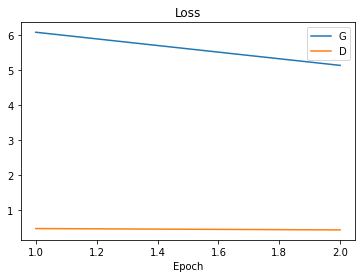

{'G': [6.077842940555947, 5.129397395759168], 'D': [0.4597763809293, 0.4211327330936367]}


In [ ]:
plot_result(all_train_loss, 2, 'Loss')
print(all_train_loss)

In [ ]:
def save_result(images, type):
  columxns = 3
  rows = 20
  fig = plt.figure(figsize=(15, 100))
  for i, image_epoch in enumerate(images):
    for j, image in enumerate(image_epoch):
      fig.add_subplot(rows, columxns, i+j+1)
      save_image(image, "{}_{}_{}.png".format(type, i, j))
      img = Image.open("{}_{}_{}.png".format(type, i, j))
      # x = image.cpu().data.numpy()
      plt.imshow(img)
      plt.axis('off')

Save summer results from output of model

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


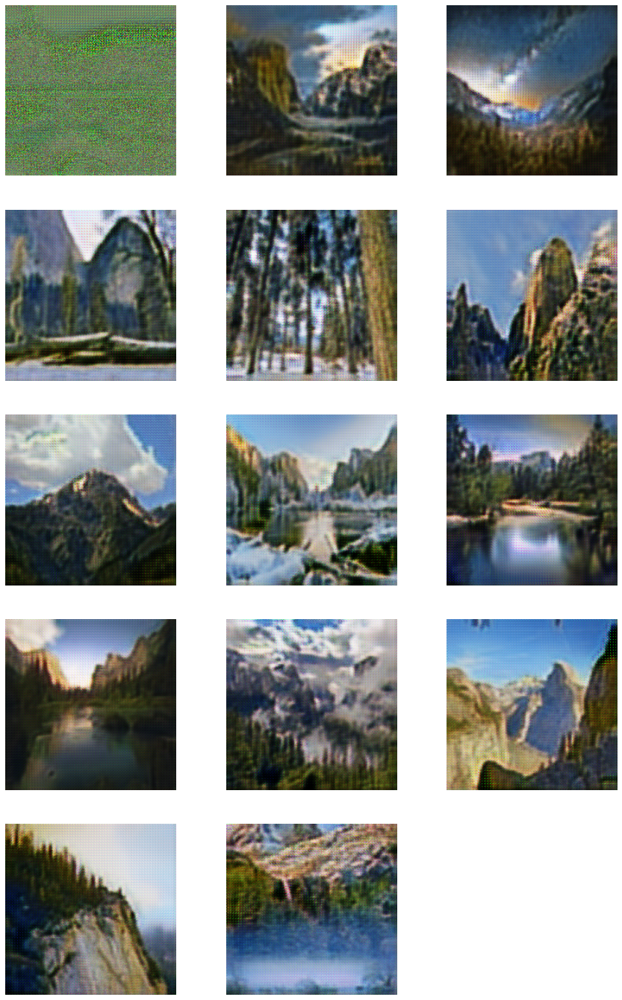

In [ ]:
save_result(summers, 'summer')

Save winter results from output of model

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


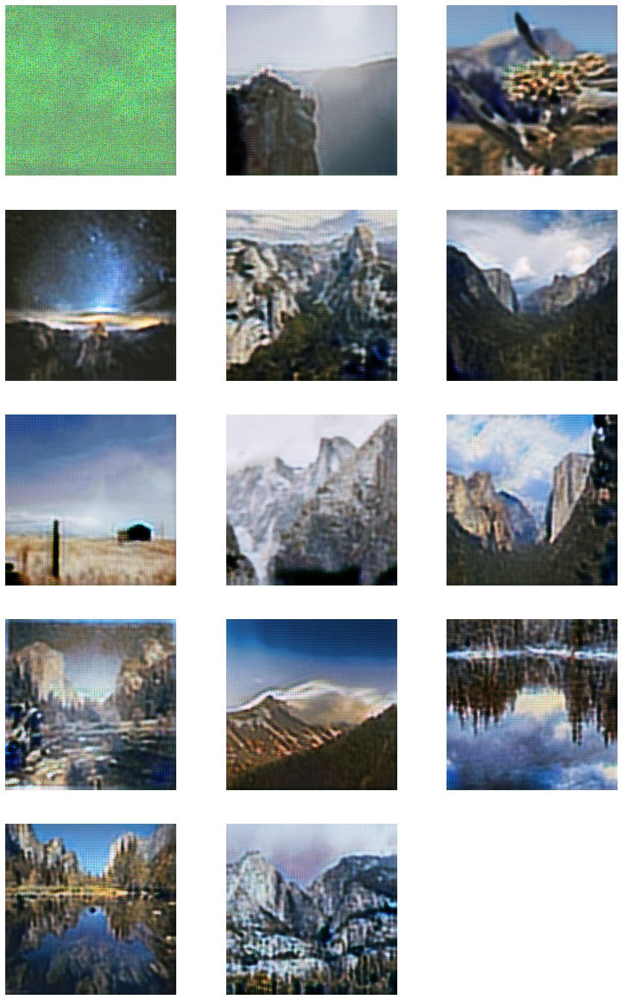

In [ ]:
save_result(winters, 'winter')

## Using U-net

In [ ]:
G_summer2winter = Generator().cuda()
D_summer2winter = Unet(3, 3).cuda()

In [ ]:
G_winter2summer = Generator().cuda()
D_winter2summer = Unet(3, 3).cuda()

In [ ]:
D_opt = optim.Adam(list(D_summer2winter.parameters()) + list(D_winter2summer.parameters()), lr=1e-5, betas=(0.5, 0.999))
G_opt = optim.Adam(list(G_summer2winter.parameters()) + list(G_winter2summer.parameters()), lr=1e-5, betas=(0.5, 0.999))

In [ ]:
summers, winters, all_train_loss = train(train_loader, G_summer2winter, D_summer2winter, G_winter2summer, D_winter2summer, D_opt, G_opt, 2)

0it [00:00, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


index = 0
index = 100
index = 200
index = 300
index = 400
index = 500
index = 600
index = 700
index = 800
index = 900
index = 1000
index = 1100
index = 1200


1it [09:23, 563.09s/it]

index = 0
index = 100
index = 200
index = 300
index = 400
index = 500
index = 600
index = 700
index = 800
index = 900
index = 1000
index = 1100
index = 1200


2it [18:41, 560.83s/it]


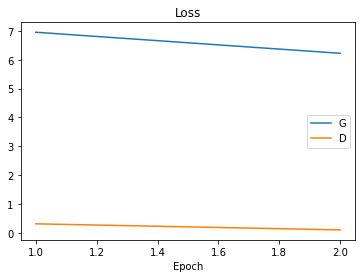

{'G': [6.955194576303713, 6.22509828047671], 'D': [0.31116899039375406, 0.09976365494259627]}


In [ ]:
plot_result(all_train_loss, 2, 'Loss')
print(all_train_loss)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


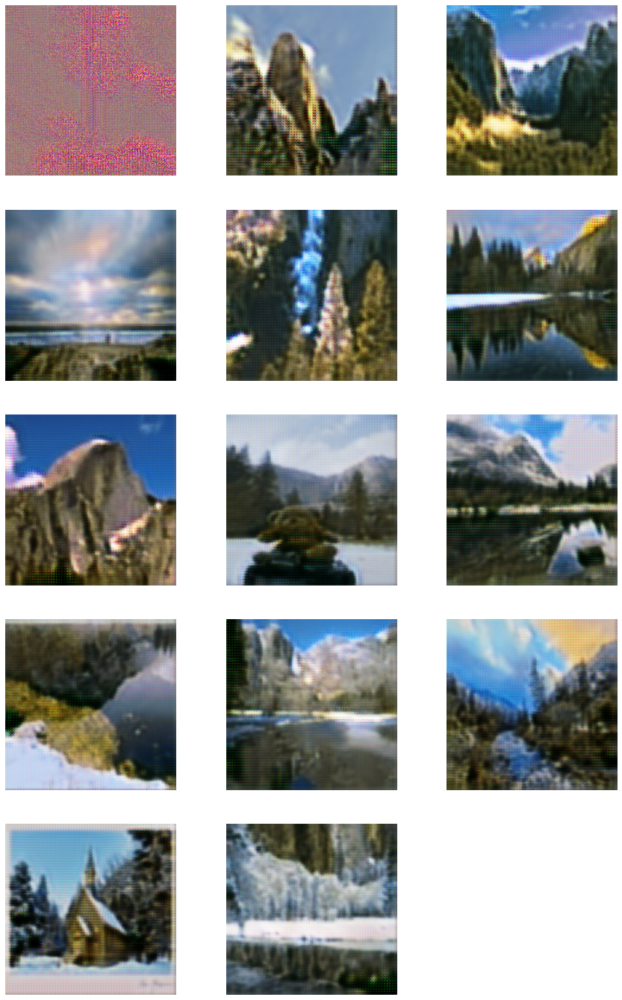

In [ ]:
save_result(summers, 'summer')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  import sys


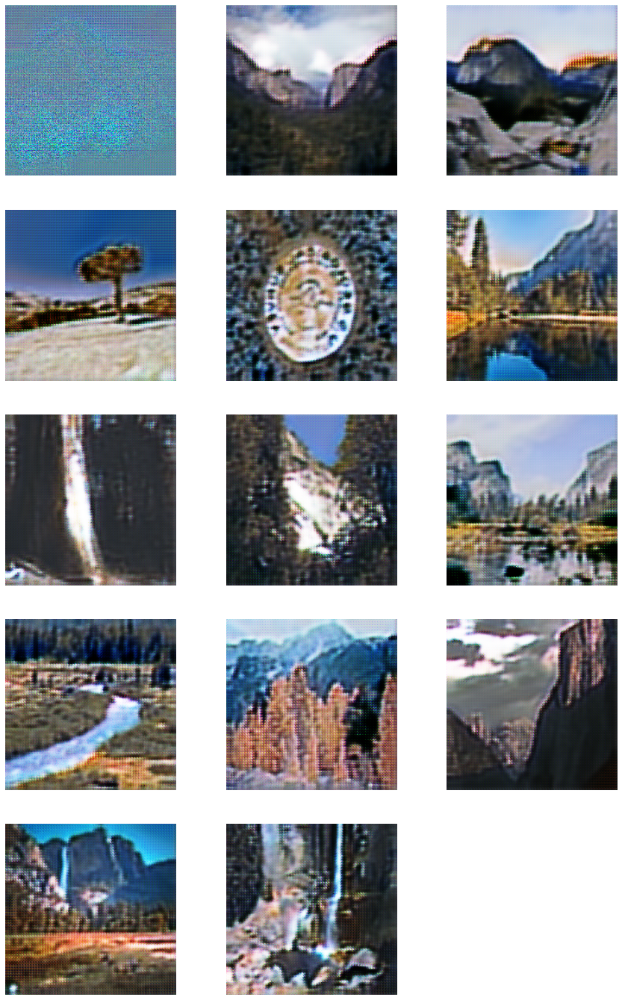

In [ ]:
save_result(winters, 'winter')